## Shell Contact Example

In [1]:
# !pip install debugpy

In [2]:
import numpy as np

import dismech


geom = dismech.GeomParams(rod_r0=0.005,
                          shell_h=0.005)

material = dismech.Material(density=1200,
                            youngs_rod=0,
                            youngs_shell=1e10,
                            poisson_rod=0,
                            poisson_shell=0.5)

shell_contact_sim = dismech.SimParams(static_sim=False,
                                  two_d_sim=False,   # no twisting
                                  use_mid_edge=False,
                                  use_line_search=False,
                                  show_floor=False,
                                  log_data=True,
                                  log_step=1,
                                  dt=2e-3,
                                  max_iter=100,
                                  total_time=2,
                                  plot_step=1,
                                  tol=1e-4,
                                  ftol=1e-4,
                                  dtol=1e-2)

env = dismech.Environment()
env.add_force('gravity', g=np.array([0.0, 0.0, 0.0])) # neutral bouyancy
env.add_force('damping', eta = 50)
# # env.add_force('aerodynamics', rho=1000, cd=1)
env.add_force('hydrodynamics', rho=1000, cd=1)
env.add_force('thrust', thrust_coeff = 1000)

# env.add_force('selfContact', delta=0.01*2*5e-3, h=5e-3)
# env.set_static()  

# geo = dismech.Geometry.from_txt('input hemisphere more dense.txt')
geo = dismech.Geometry.from_txt('input_radially_sym_hemisphere.txt')
# geo = dismech.Geometry.from_txt('input hemisphere most dense.txt')

robot = dismech.SoftRobot(geom, material, geo, shell_contact_sim, env)

In [3]:
log_node = np.array(np.where(
    robot.state.q[robot.node_dof_indices].reshape(-1, 3)[:, 2] >= 0.999)[0])

In [4]:
print("# nodes: ", np.shape(robot.nodes))
print("# faces: ", np.shape(robot.face_nodes_shell))

# nodes:  (144, 3)
# faces:  (245, 3)


### Time Stepping

As we are performing a static simulation, we must change gravity for each time step.

In [5]:
stepper = dismech.ImplicitEulerTimeStepper(robot)

In [6]:
from scipy.signal import sawtooth
import numpy as np

# One-time preprocessing function to compute tangential hinge mask
def compute_tangential_mask(robot, angle_threshold_deg=30):
    hinges = robot.hinge_springs.nodes_ind[:, 0:2]
    tangential_mask = np.zeros(len(hinges), dtype=bool)
    apex_z = np.max(robot.state.q[:robot.end_node_dof_index].reshape(-1, 3)[:, 2]) # max height of the apex

    for i, (n1, n2) in enumerate(hinges):
        p1 = robot.state.q[robot.map_node_to_dof(n1)]
        p2 = robot.state.q[robot.map_node_to_dof(n2)]
        mid = 0.5 * (p1 + p2)
        r_mid = mid - [0,0,apex_z]

        hinge_vec = p2 - p1
        hinge_vec /= np.linalg.norm(hinge_vec)

        radial_vec = r_mid / np.linalg.norm(r_mid)

        angle_cos = np.dot(hinge_vec, radial_vec)
        angle_deg = np.degrees(np.arccos(np.clip(np.abs(angle_cos), -1.0, 1.0)))

        if angle_deg > (90 - angle_threshold_deg):
            tangential_mask[i] = True

    return tangential_mask



# Precompute tangential hinge mask ONCE
robot.tangential_hinge_mask = compute_tangential_mask(robot)

print("hinges:", robot.hinge_springs.nodes_ind[:, 0:2])
print("tangential hinges:",robot.tangential_hinge_mask )


# Modified actuation function
def actuate_jellyfish(robot, t):
    pulse_freq = 2                   # Hz
    pulse_amplitude = 3*np.pi/5   # radians
    theta_rest = 0.0

    T = 1.0 / pulse_freq
    s = 0.5 * (1 - sawtooth(2 * np.pi * t / T, width=0.3))  # asymmetric contraction
    theta_base = theta_rest - pulse_amplitude * s

    n_hinges = robot.hinge_springs.inc_strain.shape[0]
    theta_bars = np.zeros(n_hinges)

    q_nodes = robot.state.q[:robot.end_node_dof_index].reshape(-1, 3)
    apex_z = np.max(q_nodes[:, 2])
    radii = np.linalg.norm(q_nodes[:, :2], axis=1)
    base_radius = np.max(radii)

    for i in range(n_hinges):
        if not robot.tangential_hinge_mask[i]:
            continue  # skip non-tangential hinges

        n1, n2 = robot.hinge_springs.nodes_ind[i, 0:2]
        p1 = robot.state.q[robot.map_node_to_dof(n1)]
        p2 = robot.state.q[robot.map_node_to_dof(n2)]
        midpoint = 0.5 * (p1 + p2)

        r = np.linalg.norm(midpoint[:2]) / base_radius
        z = midpoint[2] / apex_z

        # traveling wave with delay based on height
        # phase_delay = 0.1 * z
        phase_delay = 0.15* (1 - z)
        theta = theta_rest - pulse_amplitude * 0.5 * (1 - sawtooth(2 * np.pi * (t - phase_delay) / T, width=0.3))

        # scale actuation by radial location
        # scale = 3 * r**2 - 2 * r**3
        scale = 0.3 + 0.7 * (3 * r**2 - 2 * r**3) # smoothstep function for scaling
        # scale = 1
        theta_bars[i] = theta * scale

    robot.hinge_springs.inc_strain = theta_bars
    return robot

# Assign the stepper callback
stepper.before_step = actuate_jellyfish


hinges: [[ 55  31]
 [ 53  54]
 [ 54  31]
 [ 31  32]
 [ 35  34]
 [ 60  35]
 [ 35  59]
 [ 90 129]
 [ 90  91]
 [ 60  59]
 [ 59  91]
 [ 55  54]
 [ 83  53]
 [ 53  82]
 [ 32  55]
 [ 88 126]
 [ 35  36]
 [ 18  17]
 [ 17  35]
 [ 35  18]
 [ 17   6]
 [ 15  32]
 [ 34  17]
 [ 17  16]
 [ 29  51]
 [ 79 116]
 [115  79]
 [114  79]
 [114  78]
 [ 78  79]
 [ 51  28]
 [ 50  79]
 [ 79  80]
 [ 50  80]
 [ 51  50]
 [108  73]
 [ 73  72]
 [107  73]
 [ 74 108]
 [ 97  98]
 [ 45  73]
 [ 73  74]
 [ 46  73]
 [ 46  74]
 [ 46  75]
 [ 48  26]
 [ 28  29]
 [ 29  13]
 [ 13  14]
 [ 14   4]
 [  4   3]
 [ 13   4]
 [ 28  13]
 [  1   8]
 [  1  21]
 [  9   1]
 [ 59  34]
 [ 90  59]
 [ 59  58]
 [ 91 129]
 [ 60  91]
 [ 92  91]
 [ 91 130]
 [130  92]
 [122  85]
 [ 54  83]
 [ 83  84]
 [ 85  54]
 [ 54  84]
 [ 84  85]
 [ 82  52]
 [ 81  82]
 [ 81  52]
 [ 52  51]
 [ 51  80]
 [ 81  51]
 [ 83  82]
 [120  83]
 [ 83 119]
 [ 82 118]
 [119  82]
 [ 53  31]
 [ 52  53]
 [ 53  30]
 [ 29  52]
 [ 52  30]
 [ 14  29]
 [ 29  30]
 [ 15  14]
 [ 14  30]
 [

In [7]:
print(robot.hinge_springs.inc_strain.shape)

(347,)


In [8]:
robots = stepper.simulate()

qs = np.stack([robot.state.q for robot in robots])

iter: 1, error: 7257.132
iter: 2, error: 24627.835
iter: 3, error: 2548.386
iter: 4, error: 4886.122
iter: 5, error: 14.611
current_time:  0.002
iter: 1, error: 2899.277
iter: 2, error: 145980.179
iter: 3, error: 2725.233
iter: 4, error: 3122.397
iter: 5, error: 34.598
current_time:  0.004
iter: 1, error: 3143.990
iter: 2, error: 79235.613
iter: 3, error: 606.535
iter: 4, error: 284.570
current_time:  0.006
iter: 1, error: 3143.856
iter: 2, error: 57447.538
iter: 3, error: 252.598
iter: 4, error: 55.655
current_time:  0.008
iter: 1, error: 3093.579
iter: 2, error: 61697.697
iter: 3, error: 168.294
iter: 4, error: 12.086
current_time:  0.01
iter: 1, error: 3070.289
iter: 2, error: 76985.410
iter: 3, error: 146.944
iter: 4, error: 5.126
current_time:  0.012
iter: 1, error: 3062.299
iter: 2, error: 86907.309
iter: 3, error: 133.952
iter: 4, error: 14.313
current_time:  0.014
iter: 1, error: 3041.526
iter: 2, error: 86281.210
iter: 3, error: 105.518
iter: 4, error: 13.847
current_time:  0.

[[ 6.80695671e-06 -2.00239717e-17  9.99035542e-01]
 [ 1.25606959e-06 -4.40137724e-18  9.99108394e-01]
 [-7.36548397e-06  5.86456649e-18  9.99430673e-01]
 ...
 [-6.57563445e-04 -1.73097965e-04  1.14474811e+00]
 [-6.55842036e-04 -1.86964156e-04  1.14486887e+00]
 [-6.54073880e-04 -2.00962120e-04  1.14498699e+00]]


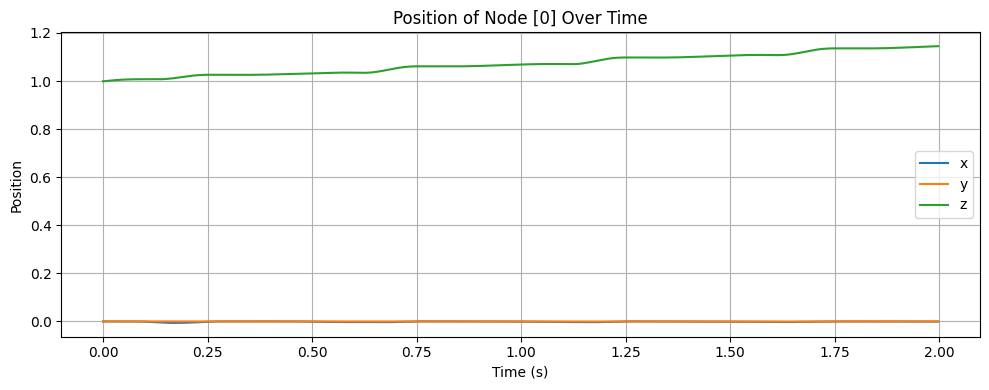

In [9]:
import matplotlib.pyplot as plt

# Extract the DOF indices (x, y, z) of the node you want to track
log_node_dofs = robot.map_node_to_dof(log_node)  # e.g., [ix, iy, iz]

# Extract position of that node across all timesteps
logged = qs[:, log_node_dofs].squeeze()  # shape (n_timesteps, 3)

# Plot x, y, z over time
t = np.arange(qs.shape[0]) * robot.sim_params.dt

print(logged)

plt.figure(figsize=(10, 4))
plt.plot(t, logged[:, 0], label='x')
plt.plot(t, logged[:, 1], label='y')
plt.plot(t, logged[:, 2], label='z')
plt.xlabel('Time (s)')
plt.ylabel('Position')
plt.title(f'Position of Node {log_node} Over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [10]:
t = np.arange(robot.sim_params.total_time, step=robot.sim_params.dt)
options = dismech.AnimationOptions(title='Shell contact p2p', plot_step=10)

fig = dismech.get_interactive_animation_plotly(robot, t, qs, options)
fig.show()

101


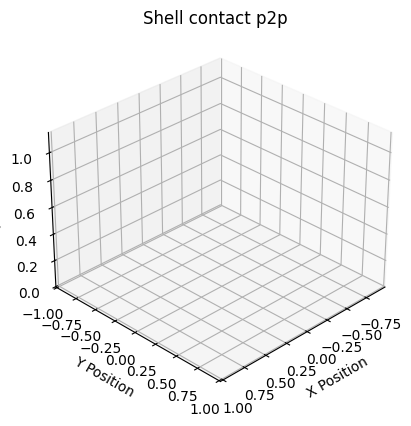

In [11]:
ani = dismech.get_animation(robot, t, qs, options)
ani.save('jellyfish_only_shell.gif')